In [42]:
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
import matplotlib.animation as animation
from matplotlib import rc

%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
rcParams['figure.figsize'] = 14, 8
RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)

In [44]:
houses = pd.read_csv(r"C:\Users\laser\Downloads\RealEstate_Georgia.csv")

In [45]:
houses.head()

,datePostedString,is_bankOwned,is_forAuction,event,price,pricePerSquareFoot,city,yearBuilt,streetAddress,zipcode,...,buildingArea,parking,garageSpaces,hasGarage,levels,pool,spa,isNewConstruction,homeType,county
0,7/9/20,0,0,Listed for sale,399000,117,Baxley,2007,4886 Blackshear Hwy,31513,...,0,1,0,0,0.0,0,0,0,SINGLE_FAMILY,Appling County
1,10/14/20,0,0,Price change,299900,152,Baxley,2021,0 Golf Rd,31513,...,0,0,0,0,0.0,0,0,0,SINGLE_FAMILY,Appling County
2,10/16/20,0,0,Listed for sale,170000,172,Baxley,1989,729 Max Deen Dr,31513,...,0,0,0,0,0.0,0,0,0,SINGLE_FAMILY,Appling County
3,4/17/21,0,0,Listed for sale,319000,88,Baxley,1978,790 Jekyll Rd,31513,...,0,1,0,0,0.0,1,0,0,SINGLE_FAMILY,Appling County
4,5/20/21,0,0,Price change,287000,99,Baxley,1996,150 Caney Creek Ln,31513,...,0,1,0,0,0.0,0,0,0,SINGLE_FAMILY,Appling County


In [46]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

date_encoded=le.fit_transform(houses["datePostedString"])
event_encoded=le.fit_transform(houses["event"])
city_encoded=le.fit_transform(houses["city"])
hometype_encoded=le.fit_transform(houses["homeType"])
county_encoded=le.fit_transform(houses["county"])
address_encoded=le.fit_transform(houses["streetAddress"])
lotareaunits_encoded=le.fit_transform(houses["lotAreaUnits"])

In [47]:
features = zip(date_encoded, houses["is_bankOwned"], houses["is_forAuction"], event_encoded,  \
    houses["pricePerSquareFoot"], city_encoded, houses["yearBuilt"], address_encoded, houses["parking"], \
    houses["livingArea"], houses["buildingArea"], lotareaunits_encoded, houses["bathrooms"], houses["bedrooms"], \
    houses["garageSpaces"], houses["hasGarage"], houses["levels"], houses["pool"], houses["spa"], \
    houses["isNewConstruction"], hometype_encoded, county_encoded, houses["price"])
data = list(features)
print (len(data))

8187


In [48]:
print(data[0])

(225, 0, 0, 0, 117, 34, 2007, 5943, 1, 3400, 0, 0, 4, 5, 0, 0, 0.0, 0, 0, 0, 2, 0, 399000)


In [49]:
df = pd.DataFrame(data)
print("Before", df.isnull().sum().sum(), "nulls out of", len(df))

df=df.dropna()
print("After", df.isnull().sum().sum(), "nulls out of", len(df))

Before 0 nulls out of 8187
After 0 nulls out of 8187


In [50]:
X=df.loc[:,0:21]
y=df.iloc[:,22]
print(X.shape[0], X.shape[1], len(y))
print(X.head(5))
print(y[0:5])
list_y=list(y)
print(list_y[0:5])

8187 22 8187
    0   1   2   3    4   5     6     7   8     9   ...  12  13  14  15   16  \
0  225   0   0   0  117  34  2007  5943   1  3400  ...   4   5   0   0  0.0   
1   19   0   0   3  152  34  2021    13   0  1968  ...   3   4   0   0  0.0   
2   20   0   0   0  172  34  1989  7367   0   988  ...   1   2   0   0  0.0   
3  122   0   0   0   88  34  1978  7566   1  3631  ...   6   4   0   0  0.0   
4  155   0   0   3   99  34  1996  1676   1  2906  ...   3   4   0   0  0.0   

   17  18  19  20  21  
0   0   0   0   2   0  
1   0   0   0   2   0  
2   0   0   0   2   0  
3   1   0   0   2   0  
4   0   0   0   2   0  

[5 rows x 22 columns]
0    399000
1    299900
2    170000
3    319000
4    287000
Name: 22, dtype: int64
[399000, 299900, 170000, 319000, 287000]


In [51]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, list_y, test_size=0.25, random_state=1)

In [52]:
print(len(X_train), len(y_train), len(X_test), len(y_test))

6140 6140 2047 2047


In [53]:
from sklearn.neural_network import MLPRegressor

from sklearn.metrics import mean_squared_error
from math import sqrt

In [54]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
print(X_train[0:5])
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
print(X_train[0:5])

       0   1   2   3    4    5     6     7   8     9   ...  12  13  14  15  \
4492  213   0   0   0   86   21  1949  4497   0   990  ...   1   3   0   1   
5741  182   0   0   0  124  223  2003  2765   1  4122  ...   4   4   0   1   
1930  211   0   0   0  158  263  1976  5724   1  3694  ...   4   5   2   1   
7701  213   0   0   0  142  480  2003  7155   0  1680  ...   2   3   0   0   
7755  138   0   0   0  119   40  1988  2594   0  2508  ...   3   2   0   0   

       16  17  18  19  20   21  
4492  1.0   0   0   0   2   54  
5741  1.5   0   0   0   2   69  
1930  2.0   0   0   0   2   29  
7701  0.0   0   0   0   2  127  
7755  0.0   0   0   0   2  132  

[5 rows x 22 columns]
[[ 0.41878274 -0.01276295 -0.01805101 -0.52007188 -0.03738162 -1.30592778
  -0.09999366  0.17386079 -1.48253724 -0.60070277 -0.37856082 -0.72933951
  -1.03043176 -0.3099262  -0.69789774  0.91199904 -0.31864744 -0.29677217
  -0.32020599 -0.26468709  0.11960364 -0.16059193]
 [-0.42752415 -0.01276295 -0.01805101

In [55]:
from sklearn.neural_network import MLPRegressor

reg_model = MLPRegressor(solver='lbfgs', max_iter=3000, hidden_layer_sizes=(6, 2), random_state=21)
reg_model.fit(X_train, y_train)
pred = reg_model.predict(X_test)


RMSE (original): 232268.99041176107


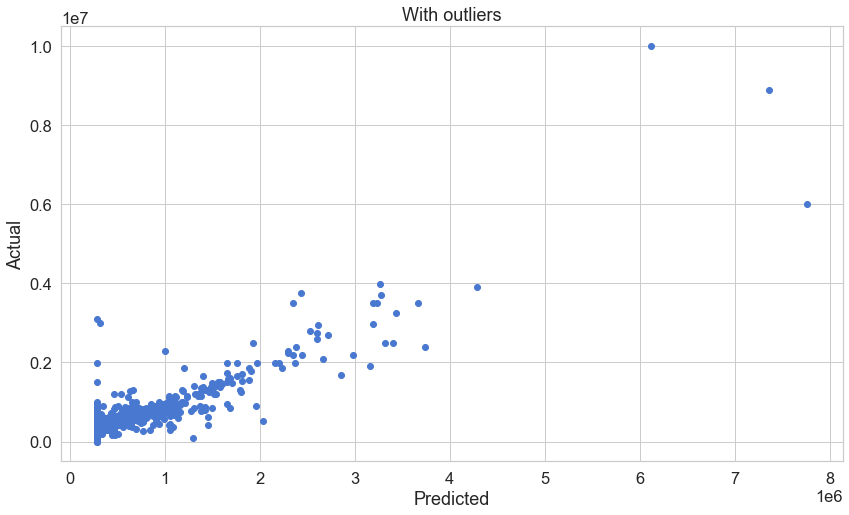

RMSE (no outliers): 209666.57414561475


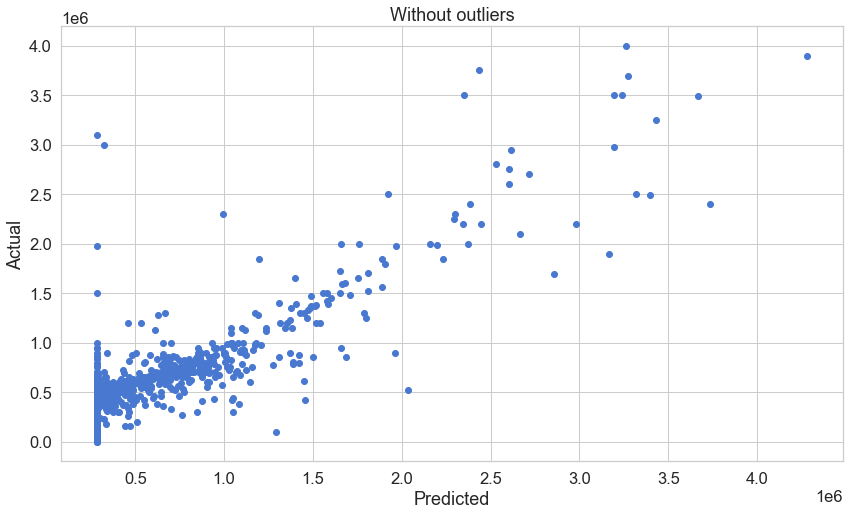

In [56]:
print("RMSE (original):", np.sqrt(mean_squared_error(y_test, pred)))
plt.scatter(pred, y_test)
plt.title("With outliers")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

#remove outliers "by hand"
pred_outliers_removed = [x for x in pred if x < 6000000]
y_test_outliers_removed = [x for x in y_test if x < 6000000]

print("RMSE (no outliers):", np.sqrt(mean_squared_error(pred_outliers_removed, y_test_outliers_removed)))
plt.clf()
plt.scatter(pred_outliers_removed, y_test_outliers_removed)
plt.title("Without outliers")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



In [57]:
for predicted, actual in zip(pred, y_test):
    print(round(predicted), actual, round(predicted-actual))

284444 295000 -10556
284444 575000 -290556
488894 625000 -136106
284444 150000 134444
284444 459900 -175456
284444 142900 141544
284444 349900 -65456
284444 500000 -215556
543291 599000 -55709
284444 187900 96544
924529 825000 99529
284444 159990 124454
284444 269900 14544
284444 220000 64444
284444 385000 -100556
284444 369900 -85456
284444 525000 -240556
284444 25000 259444
284444 276000 8444
284444 215000 69444
284444 247000 37444
284444 268900 15544
284444 246900 37544
721704 525000 196704
2345341 2195000 150341
875659 699000 176659
284444 369000 -84556
284444 269500 14944
284444 115900 168544
284444 287500 -3056
284444 450000 -165556
284444 335000 -50556
284444 289900 -5456
284444 453000 -168556
873565 649000 224565
284444 159900 124544
284444 35000 249444
284444 348000 -63556
2663915 2100000 563915
284444 170000 114444
284444 339900 -55456
376930 600000 -223070
284444 250000 34444
284444 69900 214544
284444 319900 -35456
284444 360000 -75556
656532 359000 297532
284444 350000 -65

In [58]:
houses['price'].describe()

count    8.187000e+03
mean     4.266418e+05
std      5.192830e+05
min      7.950000e+02
25%      1.999000e+05
50%      3.149000e+05
75%      4.799000e+05
max      1.275000e+07
Name: price, dtype: float64

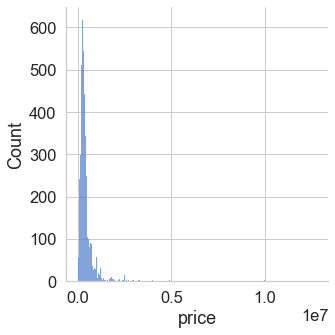

In [59]:
sns.displot(houses['price'])

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='livingArea', ylabel='price'>

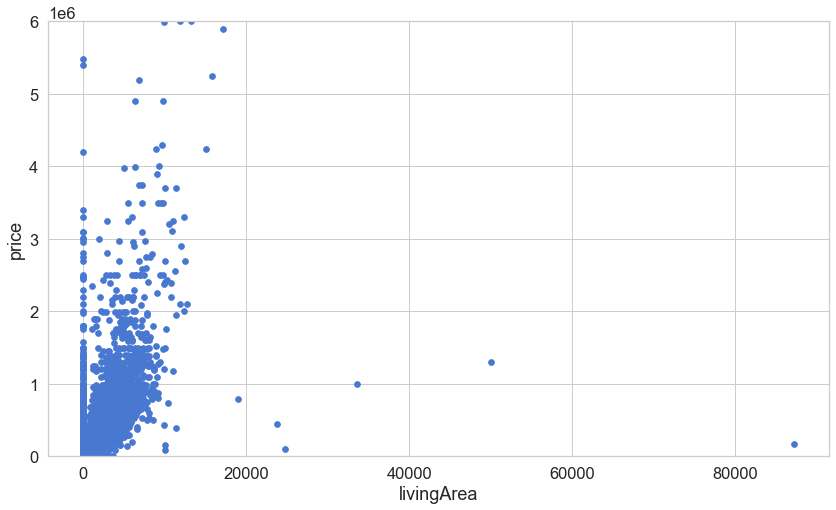

In [60]:
var = 'livingArea'
scatterplt = pd.concat([houses['price'], houses[var]], axis=1)
scatterplt.plot.scatter(x=var, y='price',ylim=(0, 6000000), s=32)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='buildingArea', ylabel='price'>

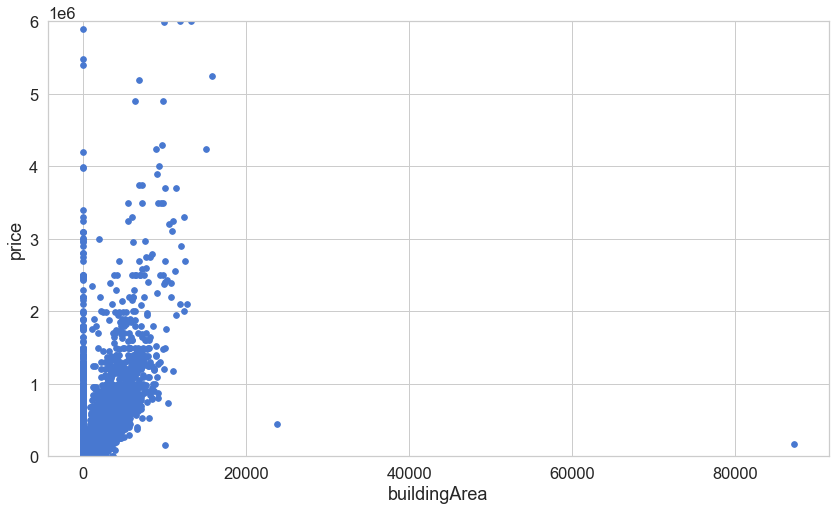

In [61]:
var = 'buildingArea'
scatterplt = pd.concat([houses['price'], houses[var]], axis=1)
scatterplt.plot.scatter(x=var, y='price',ylim=(0, 6000000), s=32)

(-0.5, 17.5, 0.0, 6000000.0)

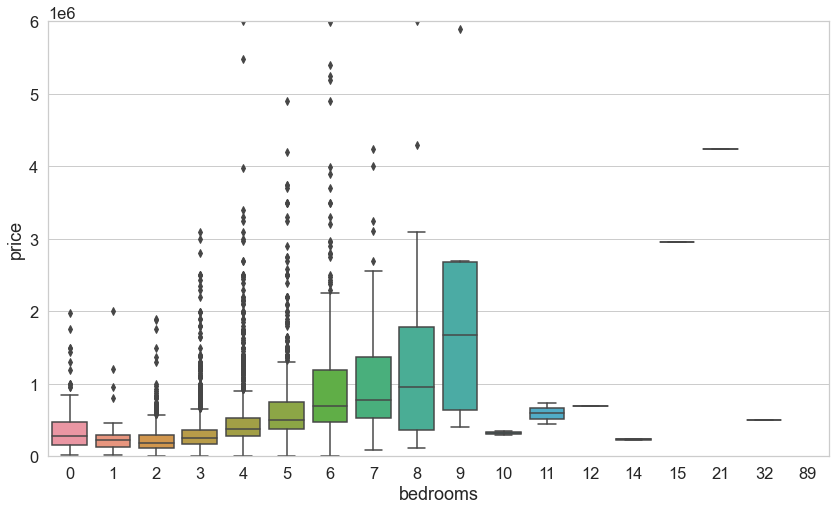

In [62]:
var = 'bedrooms'
plot = pd.concat([houses['price'], houses[var]], axis=1)
f, ax = plt.subplots(figsize=(14, 8))
fig = sns.boxplot(x=var, y ='price', data=houses)
fig.axis(ymin = 0, ymax= 6000000)

(-0.5, 16.5, 0.0, 6000000.0)

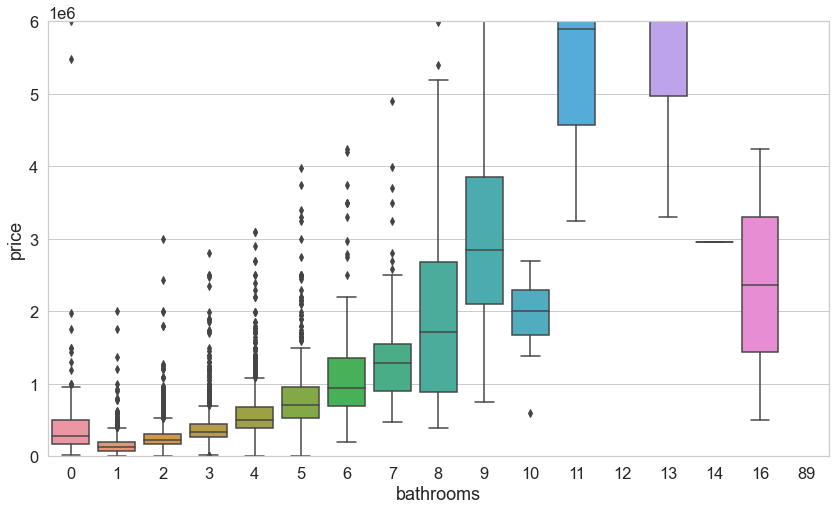

In [63]:
var = 'bathrooms'
plot = pd.concat([houses['price'], houses[var]], axis=1)
f, ax = plt.subplots(figsize=(14, 8))
fig = sns.boxplot(x=var, y ='price', data=houses)
fig.axis(ymin = 0, ymax= 6000000)

(-0.5, 5.5, 0.0, 6000000.0)

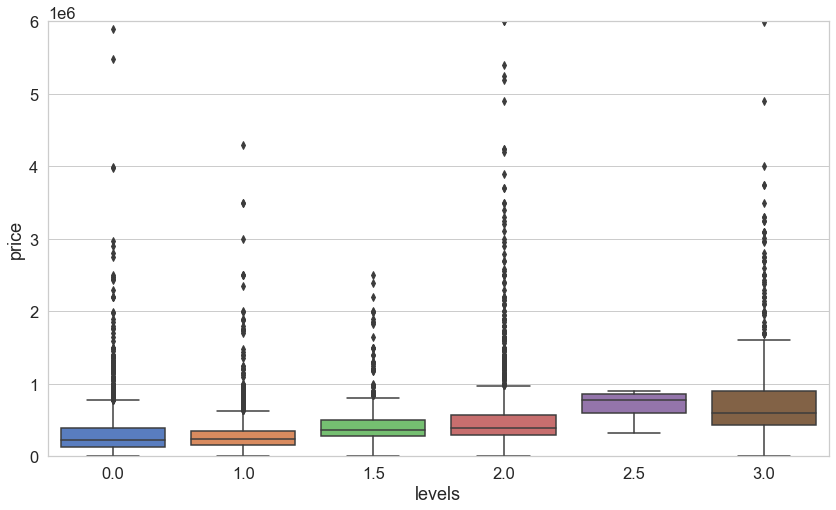

In [64]:
var = 'levels'
plot = pd.concat([houses['price'], houses[var]], axis=1)
f, ax = plt.subplots(figsize=(14, 8))
fig = sns.boxplot(x=var, y ='price', data=houses)
fig.axis(ymin = 0, ymax= 6000000)

<AxesSubplot:>

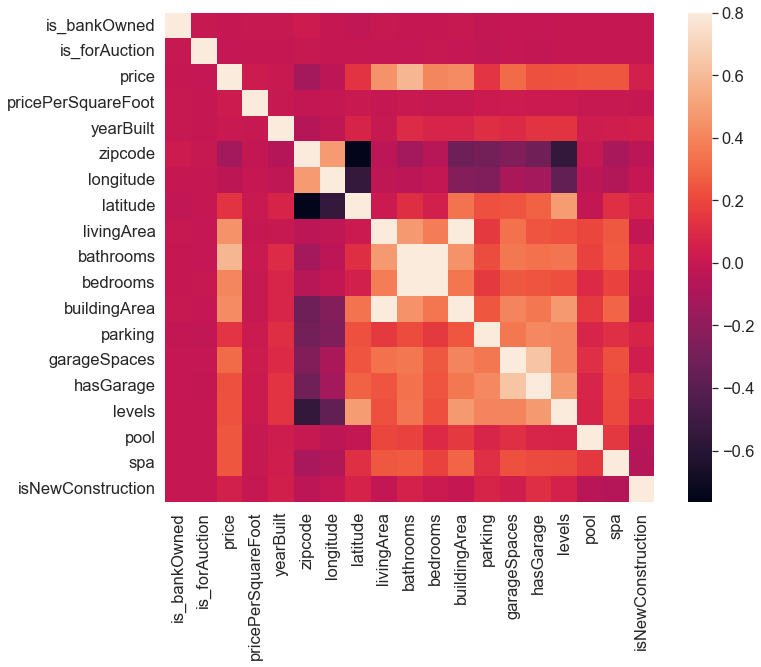

In [65]:
corrmat = houses.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square= True)

<AxesSubplot:>

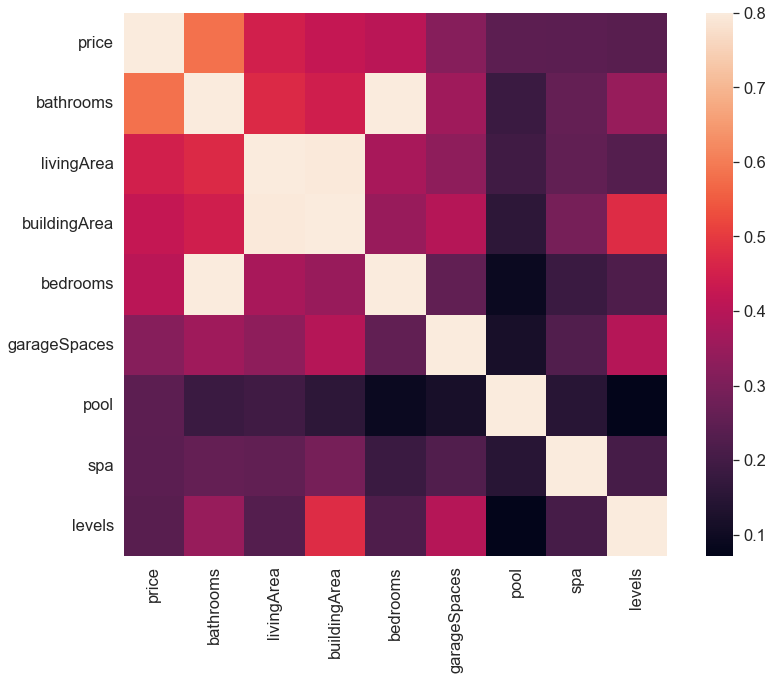

In [66]:
k = 9
cols = corrmat.nlargest(k, 'price')['price'].index
f, ax = plt.subplots(figsize=(14,10))
sns.heatmap(houses[cols].corr(), vmax = .8, square=True)

C:\Users\laser\AppData\Local\Programs\Orange\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


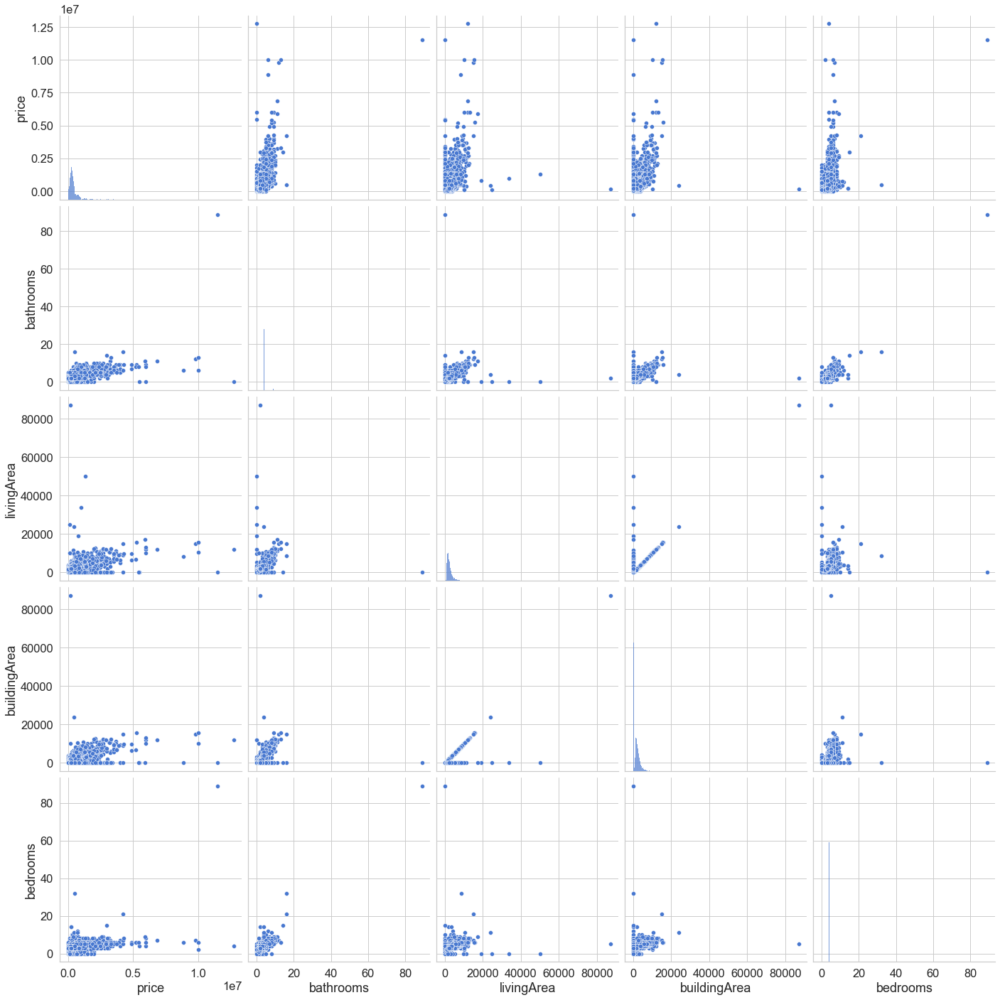

In [67]:
cols = ['price', 'bathrooms', 'livingArea', 'buildingArea', 'bedrooms']
sns.pairplot(houses[cols], size = 4)

In [68]:
def loss(h, y):
  sq_error = (h - y)**2
  n = len(y)
  return 1.0 / (2*n) * sq_error.sum()

In [69]:
x = houses['livingArea']
y = houses['price']

x = (x - x.mean()) / x.std()
x = np.c_[np.ones(x.shape[0]), x] 

In [70]:
x.shape

(8187, 2)

In [71]:
class LinearRegression:
  
  def predict(self, X):
    return np.dot(X, self._W)
  
  def _gradient_descent_step(self, X, targets, lr):

    predictions = self.predict(X)
    
    error = predictions - targets
    gradient = np.dot(X.T,  error) / len(X)

    self._W -= lr * gradient
      
  def fit(self, X, y, n_iter=100000, lr=0.01):

    self._W = np.zeros(X.shape[1])

    self._cost_history = []
    self._w_history = [self._W]
    for i in range(n_iter):
      
        prediction = self.predict(X)
        cost = loss(prediction, y)
        
        self._cost_history.append(cost)
        
        self._gradient_descent_step(x, y, lr)
        
        self._w_history.append(self._W.copy())
    return self

In [72]:
clf = LinearRegression()
clf.fit(x, y, n_iter=2000, lr=0.01)

In [73]:
#Animation

#Set the plot up,
fig = plt.figure()
ax = plt.axes()
plt.title('Sale Price vs Living Area')
plt.xlabel('Living Area in square feet (normalised)')
plt.ylabel('Sale Price ($)')
plt.scatter(x[:,1], y)
line, = ax.plot([], [], lw=2, color='red')
annotation = ax.text(-1, 700000, '')
annotation.set_animated(True)
plt.close()

#Generate the animation data,
def init():
    line.set_data([], [])
    annotation.set_text('')
    return line, annotation

# animation function.  This is called sequentially
def animate(i):
    x = np.linspace(-5, 20, 1000)
    y = clf._w_history[i][1]*x + clf._w_history[i][0]
    line.set_data(x, y)
    annotation.set_text('Cost = %.2f e10' % (clf._cost_history[i]/10000000000))
    return line, annotation

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=300, interval=10, blit=True)

rc('animation', html='jshtml')

anim